In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import json
from sqlalchemy import text
from PIL import Image
from scipy.spatial.distance import euclidean
from sklearn.preprocessing import StandardScaler
import warnings
warnings.filterwarnings('ignore')

import sys
import os
sys.path.append(os.path.dirname(os.getcwd()))
from database.connection import get_db_manager

In [2]:
# =============================================================================
# CONFIGURACIÓN SCOUTING CENTRALES FC BARCELONA
# =============================================================================

# Temporadas para análisis multi-season
SEASONS = ['2223', '2324', '2425']
CURRENT_SEASON = '2425'

# Ligas disponibles
LEAGUES_DOMESTIC = ['ENG-Premier League', 'ESP-La Liga', 'ITA-Serie A', 'GER-Bundesliga', 'FRA-Ligue 1']
LEAGUES_EXTRAS = ['POR-Primeira Liga']  # Añadir más si están disponibles

# Filtros de scouting
MIN_MINUTES_SEASON = 1200  # Minutos mínimos por temporada
MAX_AGE = 25  # Edad máxima para scouting (incluidos 25)
MAX_AGE_SUB20 = 20  # Edad máxima sub-20 (incluidos 20)
MIN_SEASONS = 2  # Mínimo temporadas con datos

# Equipos intocables (no disponibles en el mercado)
UNTOUCHABLE_TEAMS = [
    'Real Madrid', 'Manchester City', 'Bayern Munich', 'Paris Saint-Germain',
    'Liverpool', 'Arsenal', 'Chelsea'  # Añadir más según criterio
]

# Colores FC Barcelona
BARCA_COLORS = {
    'primary': '#004D98',    # Azul Barça
    'secondary': '#A50044',  # Granate Barça
    'gold': '#FFED02',       # Amarillo Barça
    'light_blue': '#87CEEB', # Azul claro
    'dark_blue': '#003366'   # Azul oscuro
}

# Búsqueda de Iñigo Martínez
INIGO_SEARCHES = [
    'Iñigo Martínez',
    'Inigo Martinez', 
    'Íñigo Martínez',
    'Martinez',
    'Iñigo'
]

# Directorio de salida
SAVE_PATH_BASE = "../images/scouting_barca/"
os.makedirs(SAVE_PATH_BASE, exist_ok=True)

In [3]:
# =============================================================================
# EXTRACCIÓN DATOS MULTI-TEMPORADA
# =============================================================================

db = get_db_manager()

# Query para domestic leagues (Big5)
query_domestic = text("""
SELECT 
    unique_player_id,
    player_name,
    team,
    league,
    season,
    position,
    nationality,
    age,
    fbref_metrics,
    understat_metrics
FROM footballdecoded.players_domestic p
WHERE p.league IN :leagues
AND p.season IN :seasons
AND p.position LIKE '%DF%'
ORDER BY p.player_name, p.season DESC
""")

print("Extrayendo datos Big5 leagues...")
df_domestic = pd.read_sql(query_domestic, db.engine, params={
    'leagues': tuple(LEAGUES_DOMESTIC),
    'seasons': tuple(SEASONS)
})
print(f"Big5: {df_domestic.shape[0]} registros")

# Query para extras leagues (Portugal, etc.)
if LEAGUES_EXTRAS:
    query_extras = text("""
    SELECT 
        unique_player_id,
        player_name,
        team,
        league,
        season,
        position,
        nationality,
        age,
        fbref_metrics,
        CAST(NULL AS JSONB) as understat_metrics  -- Extras no tiene understat
    FROM footballdecoded.players_extras p
    WHERE p.league IN :leagues
    AND p.season IN :seasons
    AND p.position LIKE '%DF%'
    ORDER BY p.player_name, p.season DESC
    """)
    
    print("Extrayendo datos extras leagues...")
    df_extras = pd.read_sql(query_extras, db.engine, params={
        'leagues': tuple(LEAGUES_EXTRAS),
        'seasons': tuple(SEASONS)
    })
    print(f"Extras: {df_extras.shape[0]} registros")
    
    # Combinar ambos datasets
    df_raw = pd.concat([df_domestic, df_extras], ignore_index=True)
else:
    df_raw = df_domestic.copy()

db.close()

print(f"\nTotal combinado: {df_raw.shape[0]} registros, {df_raw.shape[1]} columnas")
print(f"Temporadas: {sorted(df_raw['season'].unique())}")
print(f"Ligas: {sorted(df_raw['league'].unique())}")
print(f"Posiciones: {sorted(df_raw['position'].unique())}")

2025-09-08 18:31:40,816 - database.connection - INFO - Connecting to database: localhost:5432/footballdecoded_dev
2025-09-08 18:31:41,200 - database.connection - INFO - Database connection successful


Extrayendo datos Big5 leagues...
Big5: 3272 registros
Extrayendo datos extras leagues...
Extras: 207 registros

Total combinado: 3479 registros, 10 columnas
Temporadas: ['2223', '2324', '2425']
Ligas: ['ENG-Premier League', 'ESP-La Liga', 'FRA-Ligue 1', 'GER-Bundesliga', 'ITA-Serie A', 'POR-Primeira Liga']
Posiciones: ['DF', 'DF,FW', 'DF,MF', 'FW,DF', 'MF,DF']


In [4]:
# =============================================================================
# FILTRADO Y LIMPIEZA DE DATOS
# =============================================================================

def _convert_to_float(value):
    """Convierte valores a float manejando casos edge."""
    if isinstance(value, (int, float)):
        return float(value)
    if value is None or pd.isna(value):
        return np.nan
    if isinstance(value, str):
        if value.strip() == '' or value.lower().strip() in ['nan', 'none', 'null', '-']:
            return np.nan
        try:
            return float(value)
        except (ValueError, TypeError):
            return np.nan
    return np.nan

# Filtrar por minutos mínimos
df_filtered = df_raw[
    df_raw['fbref_metrics'].apply(
        lambda x: _convert_to_float(x.get('minutes_played', 0)) if isinstance(x, dict) else 0
    ) >= MIN_MINUTES_SEASON
].copy()

print(f"Filtro minutos ({MIN_MINUTES_SEASON}+): {df_filtered.shape[0]} registros")

# Filtrar centrales (excluyendo laterales puros)
# Mantener DF, DF,MF pero excluir si solo aparece como lateral en datos contextuales
central_positions = ['DF', 'DF,MF']  
df_centrals = df_filtered[df_filtered['position'].isin(central_positions)].copy()

print(f"Filtro centrales: {df_centrals.shape[0]} registros")
print(f"Posiciones mantenidas: {sorted(df_centrals['position'].unique())}")

# Contar temporadas por jugador
player_seasons = df_centrals.groupby('unique_player_id')['season'].nunique()
players_multisession = player_seasons[player_seasons >= MIN_SEASONS].index

df_multisession = df_centrals[df_centrals['unique_player_id'].isin(players_multisession)].copy()

print(f"Filtro multi-season ({MIN_SEASONS}+ temporadas): {df_multisession.shape[0]} registros")
print(f"Jugadores únicos: {df_multisession['unique_player_id'].nunique()}")

# Mostrar distribución por temporada
print("\nDistribución por temporada:")
for season in SEASONS:
    count = df_multisession[df_multisession['season'] == season].shape[0]
    print(f"  {season}: {count} centrales")

Filtro minutos (1200+): 1797 registros
Filtro centrales: 1614 registros
Posiciones mantenidas: ['DF', 'DF,MF']
Filtro multi-season (2+ temporadas): 1124 registros
Jugadores únicos: 471

Distribución por temporada:
  2223: 372 centrales
  2324: 407 centrales
  2425: 345 centrales


In [5]:
# =============================================================================
# EXTRACCIÓN Y PROCESAMIENTO DE MÉTRICAS
# =============================================================================

def extract_metrics(df, col_name):
    """Extrae métricas numéricas de columnas JSONB."""
    result = pd.DataFrame(index=df.index)
    
    all_keys = set()
    for _, row in df.iterrows():
        if isinstance(row[col_name], dict):
            all_keys.update(row[col_name].keys())
    
    for key in all_keys:
        values = []
        for _, row in df.iterrows():
            if isinstance(row[col_name], dict) and key in row[col_name]:
                raw_value = row[col_name][key]
                converted_value = _convert_to_float(raw_value)
                values.append(converted_value)
            else:
                values.append(np.nan)
        
        valid_count = pd.Series(values).notna().sum()
        if valid_count >= 10:  # Solo métricas con datos suficientes
            result[key] = values
    
    return result

# Extraer métricas de FBref y Understat
print("Extrayendo métricas FBref...")
fbref_metrics = extract_metrics(df_multisession, 'fbref_metrics')
print(f"FBref: {fbref_metrics.shape[1]} métricas")

print("Extrayendo métricas Understat...")
understat_metrics = extract_metrics(df_multisession, 'understat_metrics')
print(f"Understat: {understat_metrics.shape[1]} métricas")

# Métricas a excluir de cálculo per90
exclude_per90 = {
    'pass_completion_pct', 'shots_on_target_pct', 'Take-Ons_Succ%', 'Take-Ons_Tkld%', 
    'Aerial Duels_Won%', 'Challenges_Tkl%', 'Save%', 'Launched_Cmp%', 'Crosses_Stp%',
    'shots_per_90', 'GA90', 'GCA_GCA90', 'SCA_SCA90', 'Team Success_+/-90', 'SoT/90',
    'npxG/Sh', 'xG+xAG', 'non_penalty_xG_plus_xAG', 'avg_shot_distance', 'minutes_per_match',
    'Passes_AvgLen', 'Goal Kicks_AvgLen', 'Starts_Mn/Start', 'Subs_Mn/Sub', 'Min%',
    'matches_played', 'matches_started', 'minutes_played', 'wins', 'draws', 'losses',
    'understat_buildup_involvement_pct', 'understat_player_id', 'understat_team_id'
}

# Calcular per90 para FBref
fbref_per90 = fbref_metrics.loc[:, ~fbref_metrics.columns.isin(exclude_per90)]
fbref_per90 = (fbref_per90.div(fbref_metrics['minutes_played'], axis=0) * 90).round(3)
fbref_per90.columns = [f'{col}_per90' for col in fbref_per90.columns]

# Calcular per90 para Understat
understat_per90 = understat_metrics.loc[:, ~understat_metrics.columns.isin(exclude_per90)]
understat_per90 = (understat_per90.div(fbref_metrics['minutes_played'], axis=0) * 90).round(3)
understat_per90.columns = [f'{col}_per90' for col in understat_per90.columns]

print(f"Per90 FBref: {fbref_per90.shape[1]} métricas")
print(f"Per90 Understat: {understat_per90.shape[1]} métricas")

# Combinar todas las métricas
all_metrics = pd.concat([fbref_metrics, understat_metrics, fbref_per90, understat_per90], axis=1)
print(f"\nTotal métricas combinadas: {all_metrics.shape[1]}")

Extrayendo métricas FBref...


FBref: 185 métricas
Extrayendo métricas Understat...
Understat: 10 métricas
Per90 FBref: 154 métricas
Per90 Understat: 7 métricas

Total métricas combinadas: 356


In [6]:
# =============================================================================
# MÉTRICAS DE SCOUTING PARA CENTRALES - 10 DEFINITIVAS CORREGIDAS
# =============================================================================

# 10 métricas definitivas corregidas
SCOUTING_METRICS = {
    'defensive': {
        'metrics': [
            'pass_completion_pct',       # 1 - Porcentaje
            'Challenges_Tkl%',          # 2 - Porcentaje
            'clearances_per90',         # 6 - Per 90
            'interceptions_per90'       # 9 - Per 90
        ],
        'weight': 0.35,
        'titles': ['Pass Completion %', 'Tackle Success %', 'Clearances', 'Interceptions']
    },
    'aerial': {
        'metrics': [
            'Aerial Duels_Won_per90',   # 3 - Per 90
            'Aerial Duels_Won%',        # 4 - Porcentaje
            'Launched_Cmp%'             # 5 - % de acierto (CORREGIDO)
        ],
        'weight': 0.30,
        'titles': ['Aerial Duels Won', 'Aerial Success %', 'Long Pass Accuracy %']
    },
    'progression': {
        'metrics': [
            'progressive_passes_per90',  # 7 - Per 90
            'Tkl+Int_per90'             # 8 - Per 90
        ],
        'weight': 0.25,
        'titles': ['Progressive Passes', 'Tackles + Interceptions']
    },
    'blocking': {
        'metrics': [
            'Blocks_Sh_per90'           # 10 - Per 90 (CORREGIDO)
        ],
        'weight': 0.10,
        'titles': ['Shots Blocked']
    }
}

ALL_SCOUTING_METRICS = []
ALL_METRIC_TITLES = []
METRIC_WEIGHTS = []

for category, data in SCOUTING_METRICS.items():
    ALL_SCOUTING_METRICS.extend(data['metrics'])
    ALL_METRIC_TITLES.extend(data['titles'])
    weight_per_metric = data['weight'] / len(data['metrics'])
    METRIC_WEIGHTS.extend([weight_per_metric] * len(data['metrics']))

print("MÉTRICAS DE SCOUTING CORREGIDAS - 10 DEFINITIVAS")
print("="*52)
for category, data in SCOUTING_METRICS.items():
    print(f"\n{category.upper()} ({data['weight']:.0%} peso):")
    for i, metric in enumerate(data['metrics']):
        print(f"  • {data['titles'][i]} ({metric})")

print(f"\nTotal: {len(ALL_SCOUTING_METRICS)} métricas (10 definitivas)")
print(f"Suma pesos: {sum(METRIC_WEIGHTS):.2f}")

missing_metrics = [m for m in ALL_SCOUTING_METRICS if m not in all_metrics.columns]
if missing_metrics:
    print(f"\nMÉTRICAS NO ENCONTRADAS: {missing_metrics}")
else:
    print("\nTodas las métricas disponibles en la BD")

MÉTRICAS DE SCOUTING CORREGIDAS - 10 DEFINITIVAS

DEFENSIVE (35% peso):
  • Pass Completion % (pass_completion_pct)
  • Tackle Success % (Challenges_Tkl%)
  • Clearances (clearances_per90)
  • Interceptions (interceptions_per90)

AERIAL (30% peso):
  • Aerial Duels Won (Aerial Duels_Won_per90)
  • Aerial Success % (Aerial Duels_Won%)
  • Long Pass Accuracy % (Launched_Cmp%)

PROGRESSION (25% peso):
  • Progressive Passes (progressive_passes_per90)
  • Tackles + Interceptions (Tkl+Int_per90)

BLOCKING (10% peso):
  • Shots Blocked (Blocks_Sh_per90)

Total: 10 métricas (10 definitivas)
Suma pesos: 1.00

Todas las métricas disponibles en la BD


In [7]:
# =============================================================================
# BÚSQUEDA Y EXTRACCIÓN PERFIL IÑIGO MARTÍNEZ
# =============================================================================

inigo_id = None
inigo_name = None

print("BUSCANDO IÑIGO MARTÍNEZ...")
print("="*40)

for search_term in INIGO_SEARCHES:
    search_results = df_multisession[
        df_multisession['player_name'].str.contains(search_term, case=False, na=False)
    ]
    
    print(f"\nBúsqueda '{search_term}': {len(search_results)} resultados")
    
    if len(search_results) > 0:
        for _, player in search_results.iterrows():
            minutes = _convert_to_float(
                player['fbref_metrics'].get('minutes_played', 0) 
                if isinstance(player['fbref_metrics'], dict) else 0
            )
            print(f"  {player['unique_player_id']} - {player['player_name']} "
                  f"({player['team']}, {player['league']}, {player['season']}) - {minutes} min")
            
            # Asignar si es Iñigo y tiene minutos suficientes
            if ('martinez' in player['player_name'].lower() or 
                'martínez' in player['player_name'].lower()) and minutes >= MIN_MINUTES_SEASON:
                if not inigo_id:  # Solo asignar el primero encontrado
                    inigo_id = player['unique_player_id']
                    inigo_name = player['player_name']
                    print(f"  ASIGNADO: {inigo_name} -> {inigo_id}")
        
        if inigo_id:
            break

if inigo_id:
    # Extraer datos de Iñigo por temporada
    inigo_data = df_multisession[df_multisession['unique_player_id'] == inigo_id].copy()
    inigo_seasons = sorted(inigo_data['season'].unique())
    
    print(f"\nIÑIGO MARTÍNEZ ENCONTRADO")
    print(f"ID: {inigo_id}")
    print(f"Nombre: {inigo_name}")
    print(f"Temporadas: {inigo_seasons}")
    print(f"Equipos: {list(inigo_data['team'].unique())}")
    
    # Mostrar minutos por temporada
    print("\nMinutos por temporada:")
    for season in inigo_seasons:
        season_data = inigo_data[inigo_data['season'] == season].iloc[0]
        minutes = _convert_to_float(
            season_data['fbref_metrics'].get('minutes_played', 0)
            if isinstance(season_data['fbref_metrics'], dict) else 0
        )
        print(f"  {season}: {minutes} min ({season_data['team']})")
else:
    print("\nIÑIGO MARTÍNEZ NO ENCONTRADO")
    print("Verificar nombres en la base de datos")

BUSCANDO IÑIGO MARTÍNEZ...

Búsqueda 'Iñigo Martínez': 3 resultados
  63ab52f210f142e9 - Iñigo Martínez (Barcelona, ESP-La Liga, 2425) - 2490.0 min
  ASIGNADO: Iñigo Martínez -> 63ab52f210f142e9
  63ab52f210f142e9 - Iñigo Martínez (Barcelona, ESP-La Liga, 2324) - 1296.0 min
  63ab52f210f142e9 - Iñigo Martínez (Athletic Club, ESP-La Liga, 2223) - 1338.0 min

IÑIGO MARTÍNEZ ENCONTRADO
ID: 63ab52f210f142e9
Nombre: Iñigo Martínez
Temporadas: ['2223', '2324', '2425']
Equipos: ['Barcelona', 'Athletic Club']

Minutos por temporada:
  2223: 1338.0 min (Athletic Club)
  2324: 1296.0 min (Barcelona)
  2425: 2490.0 min (Barcelona)


In [8]:
# =============================================================================
# FUNCIONES DE SIMILARITY Y SCOUTING AVANZADAS
# =============================================================================

def calculate_player_profile(player_data, metrics_df, metric_list, seasons_list=None):
    """
    Calcula perfil promedio de un jugador para las métricas especificadas.
    Puede usar una temporada específica o promedio ponderado por minutos.
    """
    if seasons_list:
        player_data = player_data[player_data['season'].isin(seasons_list)]
    
    if len(player_data) == 0:
        return None
    
    profile = {}
    total_minutes = 0
    
    # Calcular promedio ponderado por minutos
    for _, row in player_data.iterrows():
        if isinstance(row['fbref_metrics'], dict):
            minutes = _convert_to_float(row['fbref_metrics'].get('minutes_played', 0))
            if minutes > 0:
                total_minutes += minutes
                row_idx = row.name
                
                for metric in metric_list:
                    if metric in metrics_df.columns:
                        value = metrics_df.loc[row_idx, metric]
                        if pd.notna(value):
                            if metric not in profile:
                                profile[metric] = 0
                            profile[metric] += value * minutes
    
    # Convertir a promedio ponderado
    if total_minutes > 0:
        for metric in profile:
            profile[metric] /= total_minutes
        profile['total_minutes'] = total_minutes
        return profile
    
    return None

def calculate_similarity_score(candidate_profile, reference_profile, metric_weights, metric_list):
    """
    Calcula score de similaridad entre dos perfiles usando distancia euclidiana ponderada.
    """
    if not candidate_profile or not reference_profile:
        return 0
    
    # Normalizar métricas usando z-score
    differences = []
    weights_used = []
    
    for i, metric in enumerate(metric_list):
        if metric in candidate_profile and metric in reference_profile:
            candidate_val = candidate_profile[metric]
            reference_val = reference_profile[metric]
            
            if pd.notna(candidate_val) and pd.notna(reference_val):
                # Diferencia normalizada
                diff = abs(candidate_val - reference_val)
                differences.append(diff)
                weights_used.append(metric_weights[i])
    
    if not differences:
        return 0
    
    # Distancia euclidiana ponderada
    weighted_distance = np.sqrt(sum(d**2 * w for d, w in zip(differences, weights_used)))
    
    # Convertir a score (mayor = más similar)
    # Usar función exponencial para penalizar distancias grandes
    similarity_score = 100 * np.exp(-weighted_distance / 10)
    
    return min(100, max(0, similarity_score))

def apply_scouting_filters(df_candidates, age_filter=True, team_filter=True, 
                         minutes_filter=True, season_filter=True):
    """
    Aplica filtros de scouting para disponibilidad en el mercado.
    """
    filtered_df = df_candidates.copy()
    
    if age_filter:
        # Edad máxima
        filtered_df = filtered_df[filtered_df['age'] <= MAX_AGE]
    
    if team_filter:
        # Excluir equipos intocables
        filtered_df = filtered_df[~filtered_df['team'].isin(UNTOUCHABLE_TEAMS)]
    
    if minutes_filter:
        # Minutos mínimos en temporada actual
        current_season_df = filtered_df[filtered_df['season'] == CURRENT_SEASON]
        sufficient_minutes = current_season_df[
            current_season_df['fbref_metrics'].apply(
                lambda x: _convert_to_float(x.get('minutes_played', 0)) >= MIN_MINUTES_SEASON
                if isinstance(x, dict) else False
            )
        ]['unique_player_id'].unique()
        filtered_df = filtered_df[filtered_df['unique_player_id'].isin(sufficient_minutes)]
    
    if season_filter:
        # Mínimo temporadas con datos
        player_seasons = filtered_df.groupby('unique_player_id')['season'].nunique()
        valid_players = player_seasons[player_seasons >= MIN_SEASONS].index
        filtered_df = filtered_df[filtered_df['unique_player_id'].isin(valid_players)]
    
    return filtered_df

def calculate_trending_score(player_data, metrics_df, metric_list):
    """
    Calcula score de tendencia (mejora/declive) en las últimas temporadas.
    """
    if len(player_data) < 2:
        return 50  # Neutral si solo una temporada
    
    # Ordenar por temporada
    player_data_sorted = player_data.sort_values('season')
    
    improvements = []
    
    for metric in metric_list:
        if metric in metrics_df.columns:
            values = []
            for _, row in player_data_sorted.iterrows():
                value = metrics_df.loc[row.name, metric]
                if pd.notna(value):
                    values.append(value)
            
            if len(values) >= 2:
                # Calcular tendencia (correlación con tiempo)
                time_index = list(range(len(values)))
                correlation = np.corrcoef(time_index, values)[0, 1]
                if not np.isnan(correlation):
                    improvements.append(correlation)
    
    if improvements:
        # Promedio de correlaciones -> score 0-100
        avg_correlation = np.mean(improvements)
        trending_score = 50 + (avg_correlation * 50)  # -1 to 1 -> 0 to 100
        return max(0, min(100, trending_score))
    
    return 50

print("FUNCIONES DE SCOUTING CONFIGURADAS")
print("="*40)
print("calculate_player_profile()")
print("calculate_similarity_score()")
print("apply_scouting_filters()")
print("calculate_trending_score()")

FUNCIONES DE SCOUTING CONFIGURADAS
calculate_player_profile()
calculate_similarity_score()
apply_scouting_filters()
calculate_trending_score()


In [9]:
# =============================================================================
# CREACIÓN DE PERFILES DE REFERENCIA DE IÑIGO
# =============================================================================

if inigo_id:
    # Combinar métricas base con índices de datos
    base_cols = ['unique_player_id', 'player_name', 'team', 'league', 'season', 'position', 'age']
    
    df_complete = pd.concat([
        df_multisession[base_cols],
        all_metrics
    ], axis=1)
    
    # PERFIL 1: Solo temporada 2024/25
    print("CREANDO PERFIL IÑIGO 2024/25...")
    inigo_profile_current = calculate_player_profile(
        inigo_data, all_metrics, ALL_SCOUTING_METRICS, [CURRENT_SEASON]
    )
    
    if inigo_profile_current:
        print(f"Perfil 2024/25 creado ({inigo_profile_current['total_minutes']:.0f} minutos)")
        print("Métricas clave 2024/25:")
        for i, metric in enumerate(ALL_SCOUTING_METRICS[:8]):  # Mostrar primeras 8
            if metric in inigo_profile_current:
                value = inigo_profile_current[metric]
                print(f"  {ALL_METRIC_TITLES[i]}: {value:.2f}")
    else:
        print("No se pudo crear perfil 2024/25")
    
    # PERFIL 2: Promedio ponderado 3 temporadas
    print("\nCREANDO PERFIL IÑIGO 3-YEAR AVERAGE...")
    inigo_profile_3year = calculate_player_profile(
        inigo_data, all_metrics, ALL_SCOUTING_METRICS, SEASONS
    )
    
    if inigo_profile_3year:
        print(f"Perfil 3-year creado ({inigo_profile_3year['total_minutes']:.0f} minutos totales)")
        print("Métricas clave 3-year:")
        for i, metric in enumerate(ALL_SCOUTING_METRICS[:8]):
            if metric in inigo_profile_3year:
                value = inigo_profile_3year[metric]
                print(f"  {ALL_METRIC_TITLES[i]}: {value:.2f}")
    else:
        print("No se pudo crear perfil 3-year")
    
    # Comparación entre perfiles
    if inigo_profile_current and inigo_profile_3year:
        print("\nCOMPARACIÓN PERFILES IÑIGO:")
        print("="*45)
        print(f"{'Métrica':<25} {'2024/25':<10} {'3-Year':<10} {'Diff':<10}")
        print("-"*60)
        
        for i, metric in enumerate(ALL_SCOUTING_METRICS):
            if metric in inigo_profile_current and metric in inigo_profile_3year:
                current_val = inigo_profile_current[metric]
                threeyear_val = inigo_profile_3year[metric]
                diff = current_val - threeyear_val
                diff_str = f"+{diff:.2f}" if diff > 0 else f"{diff:.2f}"
                
                print(f"{ALL_METRIC_TITLES[i]:<25} {current_val:<10.2f} {threeyear_val:<10.2f} {diff_str:<10}")
else:
    print("No se pueden crear perfiles sin datos de Iñigo")
    inigo_profile_current = None
    inigo_profile_3year = None

CREANDO PERFIL IÑIGO 2024/25...
Perfil 2024/25 creado (2490 minutos)
Métricas clave 2024/25:
  Pass Completion %: 91.00
  Tackle Success %: 72.70
  Clearances: 3.90
  Interceptions: 0.65
  Aerial Duels Won: 2.10
  Aerial Success %: 63.70
  Progressive Passes: 9.40

CREANDO PERFIL IÑIGO 3-YEAR AVERAGE...
Perfil 3-year creado (5124 minutos totales)
Métricas clave 3-year:
  Pass Completion %: 87.76
  Tackle Success %: 71.71
  Clearances: 3.74
  Interceptions: 0.83
  Aerial Duels Won: 2.05
  Aerial Success %: 59.96
  Long Pass Accuracy %: 11.03
  Progressive Passes: 7.32

COMPARACIÓN PERFILES IÑIGO:
Métrica                   2024/25    3-Year     Diff      
------------------------------------------------------------
Pass Completion %         91.00      87.76      +3.24     
Tackle Success %          72.70      71.71      +0.99     
Clearances                3.90       3.74       +0.16     
Interceptions             0.65       0.83       -0.17     
Aerial Duels Won          2.10       2.05

In [10]:
# =============================================================================
# ALGORITMO DE SCOUTING MEJORADO CON FILTROS DE EDAD
# =============================================================================

if inigo_profile_current and inigo_profile_3year:
    print("EJECUTANDO ALGORITMO DE SCOUTING MEJORADO...")
    print("="*50)
    
    # ANÁLISIS GENERAL (EDAD ≤ 25)
    print("\nANÁLISIS PRINCIPAL: JUGADORES ≤ 25 AÑOS")
    print("-"*45)
    
    candidates_u25 = df_multisession[df_multisession['age'] <= MAX_AGE].copy()
    
    candidates_u25_filtered = apply_scouting_filters(
        candidates_u25, age_filter=False, team_filter=True, 
        minutes_filter=True, season_filter=True
    )
    
    candidates_u25_filtered = candidates_u25_filtered[candidates_u25_filtered['unique_player_id'] != inigo_id]
    unique_u25 = candidates_u25_filtered['unique_player_id'].unique()
    
    print(f"Candidatos ≤25 años: {len(unique_u25)} jugadores")
    
    results_u25 = []
    
    for i, player_id in enumerate(unique_u25, 1):
        if i % 15 == 0:
            print(f"  Procesados {i}/{len(unique_u25)} jugadores U25")
        
        candidate_data = candidates_u25_filtered[candidates_u25_filtered['unique_player_id'] == player_id]
        
        candidate_profile = calculate_player_profile(
            candidate_data, all_metrics, ALL_SCOUTING_METRICS
        )
        
        if not candidate_profile:
            continue
        
        similarity_current = calculate_similarity_score(
            candidate_profile, inigo_profile_current, METRIC_WEIGHTS, ALL_SCOUTING_METRICS
        )
        
        similarity_3year = calculate_similarity_score(
            candidate_profile, inigo_profile_3year, METRIC_WEIGHTS, ALL_SCOUTING_METRICS
        )
        
        base_score = (similarity_current * 0.7) + (similarity_3year * 0.3)
        age_bonus = max(0, (25 - candidate_data.iloc[-1]['age']) * 2)
        combined_score = base_score + age_bonus
        
        trending_score = calculate_trending_score(
            candidate_data, all_metrics, ALL_SCOUTING_METRICS
        )
        
        latest_data = candidate_data[candidate_data['season'] == CURRENT_SEASON]
        if len(latest_data) == 0:
            latest_data = candidate_data.iloc[-1:]
        
        player_info = latest_data.iloc[0]
        current_minutes = _convert_to_float(
            player_info['fbref_metrics'].get('minutes_played', 0)
            if isinstance(player_info['fbref_metrics'], dict) else 0
        )
        
        results_u25.append({
            'unique_player_id': player_id,
            'player_name': player_info['player_name'],
            'team': player_info['team'],
            'league': player_info['league'],
            'age': player_info['age'],
            'position': player_info['position'],
            'nationality': player_info.get('nationality', 'Unknown'),
            'current_minutes': current_minutes,
            'seasons_data': len(candidate_data),
            'similarity_current': similarity_current,
            'similarity_3year': similarity_3year,
            'combined_score': min(100, combined_score),
            'trending_score': trending_score,
            'age_bonus': age_bonus,
            'candidate_profile': candidate_profile
        })
    
    results_u25_df = pd.DataFrame(results_u25)
    
    if len(results_u25_df) > 0:
        results_u25_df = results_u25_df.sort_values('combined_score', ascending=False).reset_index(drop=True)
        
        print(f"\nU25 completado: {len(results_u25_df)} candidatos")
        print(f"Score range: {results_u25_df['combined_score'].min():.1f} - {results_u25_df['combined_score'].max():.1f}")
        
        print("\nTOP 5 CANDIDATOS ≤25 AÑOS:")
        print("-"*60)
        
        top_5_u25 = results_u25_df.head(5)
        for i, (_, player) in enumerate(top_5_u25.iterrows(), 1):
            print(f"{i}. {player['player_name']} ({player['age']:.0f}a) - {player['team']} "
                  f"[Score: {player['combined_score']:.1f}, Bonus: +{player['age_bonus']:.1f}]")
    
    # ANÁLISIS SUB-20
    print(f"\n\nANÁLISIS ESPECIAL: PROMESAS SUB-{MAX_AGE_SUB20+1}")
    print("-"*40)
    
    candidates_u20 = df_multisession[df_multisession['age'] <= MAX_AGE_SUB20].copy()
    
    candidates_u20_filtered = apply_scouting_filters(
        candidates_u20, age_filter=False, team_filter=True,
        minutes_filter=False, season_filter=False
    )
    
    MIN_MINUTES_U20 = 800
    candidates_u20_filtered = candidates_u20_filtered[
        candidates_u20_filtered['fbref_metrics'].apply(
            lambda x: _convert_to_float(x.get('minutes_played', 0)) >= MIN_MINUTES_U20
            if isinstance(x, dict) else False
        )
    ]
    
    candidates_u20_filtered = candidates_u20_filtered[candidates_u20_filtered['unique_player_id'] != inigo_id]
    unique_u20 = candidates_u20_filtered['unique_player_id'].unique()
    
    print(f"Candidatos ≤{MAX_AGE_SUB20} años: {len(unique_u20)} jugadores")
    
    results_u20 = []
    
    for i, player_id in enumerate(unique_u20, 1):
        candidate_data = candidates_u20_filtered[candidates_u20_filtered['unique_player_id'] == player_id]
        
        candidate_profile = calculate_player_profile(
            candidate_data, all_metrics, ALL_SCOUTING_METRICS
        )
        
        if not candidate_profile:
            continue
        
        similarity_current = calculate_similarity_score(
            candidate_profile, inigo_profile_current, METRIC_WEIGHTS, ALL_SCOUTING_METRICS
        )
        
        trending_score = calculate_trending_score(
            candidate_data, all_metrics, ALL_SCOUTING_METRICS
        )
        
        youth_potential_score = (similarity_current * 0.5) + (trending_score * 0.5)
        youth_bonus = max(0, (MAX_AGE_SUB20 - candidate_data.iloc[-1]['age']) * 5)
        combined_score = min(100, youth_potential_score + youth_bonus)
        
        latest_data = candidate_data[candidate_data['season'] == CURRENT_SEASON]
        if len(latest_data) == 0:
            latest_data = candidate_data.iloc[-1:]
        
        player_info = latest_data.iloc[0]
        current_minutes = _convert_to_float(
            player_info['fbref_metrics'].get('minutes_played', 0)
            if isinstance(player_info['fbref_metrics'], dict) else 0
        )
        
        results_u20.append({
            'unique_player_id': player_id,
            'player_name': player_info['player_name'],
            'team': player_info['team'],
            'league': player_info['league'],
            'age': player_info['age'],
            'position': player_info['position'],
            'nationality': player_info.get('nationality', 'Unknown'),
            'current_minutes': current_minutes,
            'seasons_data': len(candidate_data),
            'similarity_current': similarity_current,
            'combined_score': combined_score,
            'trending_score': trending_score,
            'youth_bonus': youth_bonus,
            'candidate_profile': candidate_profile
        })
    
    results_u20_df = pd.DataFrame(results_u20)
    
    if len(results_u20_df) > 0:
        results_u20_df = results_u20_df.sort_values('combined_score', ascending=False).reset_index(drop=True)
        
        print(f"U{MAX_AGE_SUB20+1} completado: {len(results_u20_df)} candidatos")
        
        print(f"\nTOP 3 PROMESAS ≤{MAX_AGE_SUB20} AÑOS:")
        print("-"*55)
        
        top_3_u20 = results_u20_df.head(3)
        for i, (_, player) in enumerate(top_3_u20.iterrows(), 1):
            print(f"{i}. {player['player_name']} ({player['age']:.0f}a) - {player['team']}"
                  f" [Potencial: {player['combined_score']:.1f}, Trending: {player['trending_score']:.1f}]")
    
    print("\nALGORITMO MEJORADO COMPLETADO")
    print(f"Total candidatos analizados: {len(results_u25_df) + len(results_u20_df)}")
    
else:
    print("No se puede ejecutar algoritmo sin perfiles de Iñigo")
    results_u25_df = pd.DataFrame()
    results_u20_df = pd.DataFrame()

EJECUTANDO ALGORITMO DE SCOUTING MEJORADO...

ANÁLISIS PRINCIPAL: JUGADORES ≤ 25 AÑOS
---------------------------------------------
Candidatos ≤25 años: 121 jugadores
  Procesados 15/121 jugadores U25
  Procesados 30/121 jugadores U25
  Procesados 45/121 jugadores U25
  Procesados 60/121 jugadores U25
  Procesados 75/121 jugadores U25
  Procesados 90/121 jugadores U25
  Procesados 105/121 jugadores U25
  Procesados 120/121 jugadores U25

U25 completado: 121 candidatos
Score range: 30.6 - 91.1

TOP 5 CANDIDATOS ≤25 AÑOS:
------------------------------------------------------------
1. Castello Lukeba (21a) - RB Leipzig [Score: 91.1, Bonus: +12.0]
2. Logan Costa (23a) - Villarreal [Score: 85.8, Bonus: +6.0]
3. Nuno Mendes (22a) - Paris S-G [Score: 85.0, Bonus: +10.0]
4. Bafodé Diakité (23a) - Lille [Score: 84.6, Bonus: +8.0]
5. Piero Hincapié (22a) - Leverkusen [Score: 83.6, Bonus: +10.0]


ANÁLISIS ESPECIAL: PROMESAS SUB-21
----------------------------------------
Candidatos ≤20 años: 27

GENERANDO VISUALIZACIONES...
Dataset visualización: 1124 centrales
Métricas radar: 10 definitivas

Generando radar #1: Castello Lukeba (U25)
DEBUG Player 1 - Team: 'Barcelona', team_logos keys: None
DEBUG Player 2 - Team: 'RB Leipzig', team_logos keys: None
Radar #1 completado: Castello Lukeba (U25)


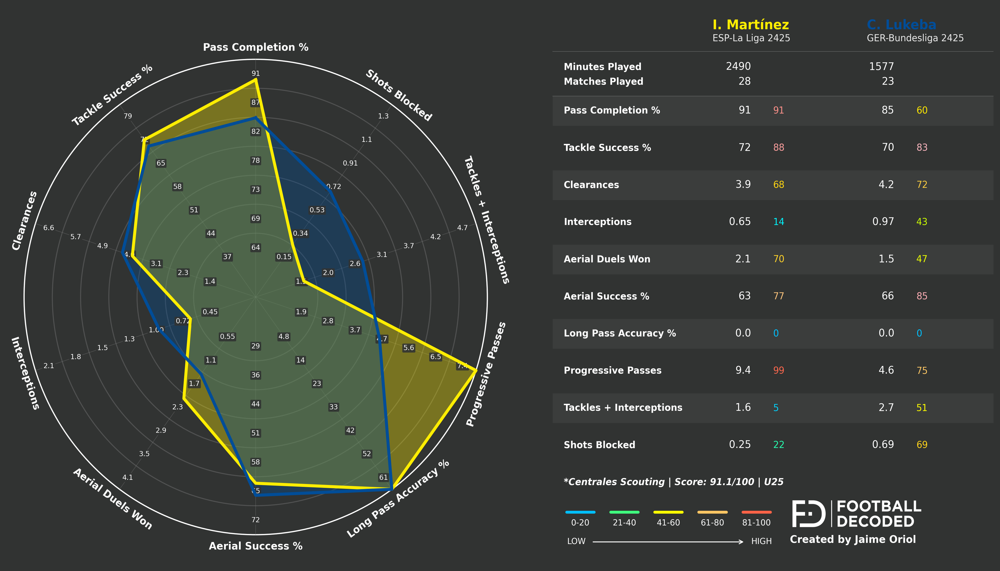


Generando radar #2: Logan Costa (U25)
DEBUG Player 1 - Team: 'Barcelona', team_logos keys: None
DEBUG Player 2 - Team: 'Villarreal', team_logos keys: None
Radar #2 completado: Logan Costa (U25)


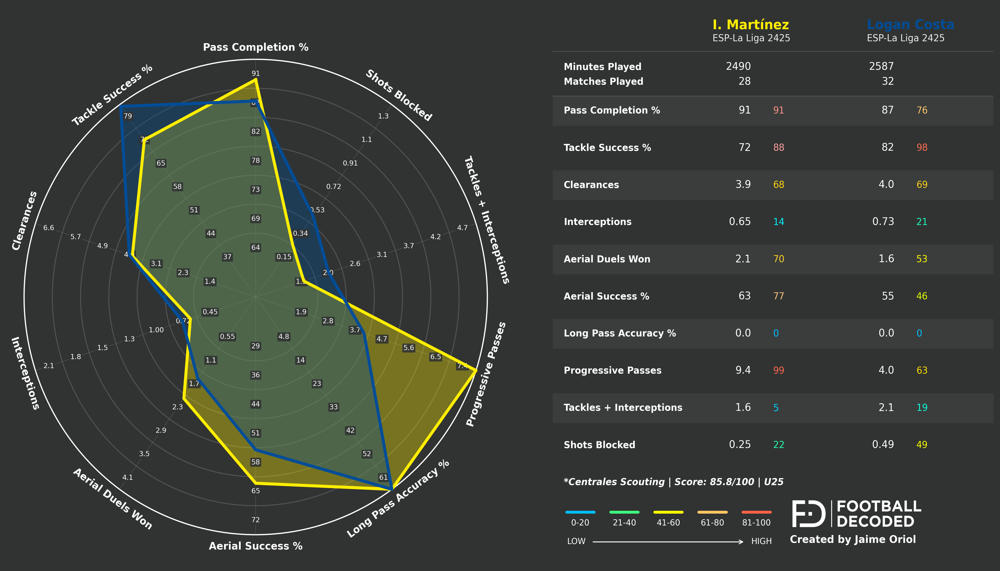


Generando radar #3: Nuno Mendes (U25)
DEBUG Player 1 - Team: 'Barcelona', team_logos keys: None
DEBUG Player 2 - Team: 'Paris S-G', team_logos keys: None
Radar #3 completado: Nuno Mendes (U25)


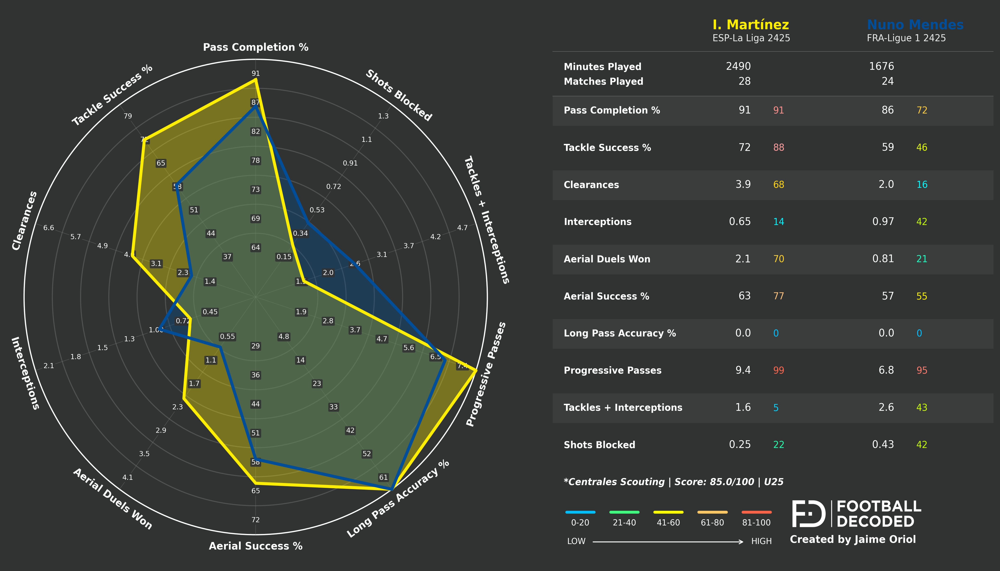


Generando radar #4: Pau Cubarsí (U20)
DEBUG Player 1 - Team: 'Barcelona', team_logos keys: None
DEBUG Player 2 - Team: 'Barcelona', team_logos keys: None
Radar #4 completado: Pau Cubarsí (U20)


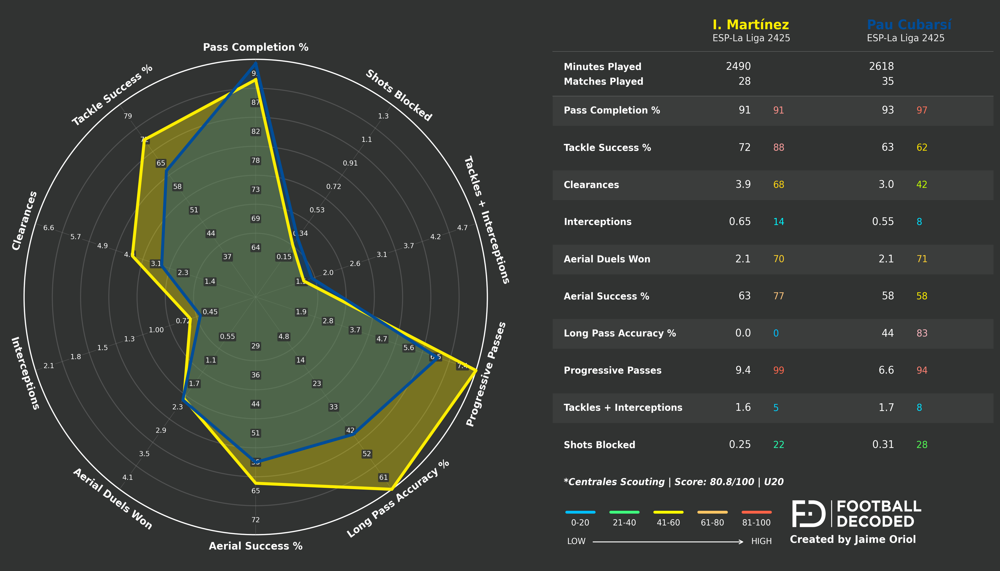


Generando radar #5: Souleymane Touré (U20)
DEBUG Player 1 - Team: 'Barcelona', team_logos keys: None
DEBUG Player 2 - Team: 'Lorient', team_logos keys: None
Radar #5 completado: Souleymane Touré (U20)


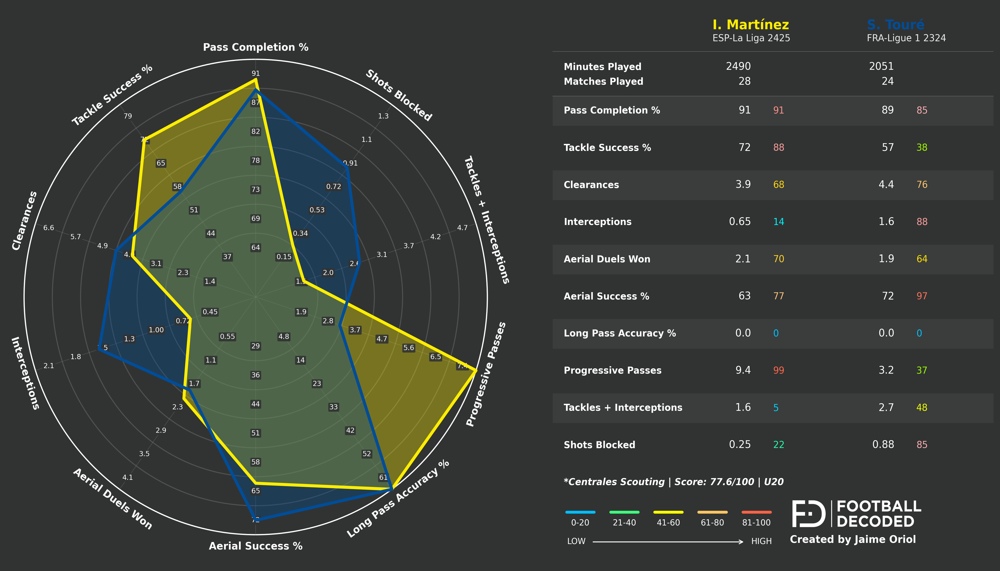


VISUALIZACIONES COMPLETADAS
Radares generados: 5/5
Archivos guardados en: ../images/scouting_barca/


In [11]:
# =============================================================================
# VISUALIZACIONES CORREGIDAS: RADARES 10 MÉTRICAS
# =============================================================================

if (len(results_u25_df) > 0 or len(results_u20_df) > 0) and inigo_id:
    from viz.swarm_radar import create_player_radar
    from viz.stats_radar import create_stats_table, combine_radar_and_table
    from IPython.display import Image as IPImage, display
    
    print("GENERANDO VISUALIZACIONES...")
    print("="*35)
    
    viz_df = pd.concat([
        df_multisession[['unique_player_id', 'player_name', 'team', 'league', 'season', 'position']],
        all_metrics
    ], axis=1)
    
    centrales_viz_df = viz_df[viz_df['position'].str.contains('DF', na=False)].copy()
    
    percentiles_df = centrales_viz_df[ALL_SCOUTING_METRICS].rank(pct=True) * 98 + 1
    percentiles_df = percentiles_df.round(0).astype('Int64')
    percentiles_df.columns = [f'{col}_pct' for col in percentiles_df.columns]
    
    viz_complete_df = pd.concat([centrales_viz_df, percentiles_df], axis=1)
    
    print(f"Dataset visualización: {viz_complete_df.shape[0]} centrales")
    print(f"Métricas radar: {len(ALL_SCOUTING_METRICS)} definitivas")
    
    top_candidates = []
    
    if len(results_u25_df) > 0:
        top_3_u25 = results_u25_df.head(3)
        for _, candidate in top_3_u25.iterrows():
            top_candidates.append(('U25', candidate))
    
    if len(results_u20_df) > 0:
        top_2_u20 = results_u20_df.head(2)
        for _, candidate in top_2_u20.iterrows():
            top_candidates.append(('U20', candidate))
    
    successful_radars = 0
    
    for i, (category, candidate) in enumerate(top_candidates[:5], 1):
        candidate_id = candidate['unique_player_id']
        candidate_name = candidate['player_name']
        
        print(f"\nGenerando radar #{i}: {candidate_name} ({category})")
        
        try:
            team_colors = [BARCA_COLORS['gold'], BARCA_COLORS['primary']]
            
            create_player_radar(
                df_data=viz_complete_df,
                player_1_id=inigo_id,
                player_2_id=candidate_id,
                metrics=ALL_SCOUTING_METRICS,
                metric_titles=ALL_METRIC_TITLES,
                team_colors=team_colors,
                save_path=f"{SAVE_PATH_BASE}inigo_vs_{category.lower()}_{i}_radar.png",
                use_swarm=False,
                show_plot=False
            )
            
            create_stats_table(
                df_data=viz_complete_df,
                player_1_id=inigo_id,
                player_2_id=candidate_id,
                metrics=ALL_SCOUTING_METRICS,
                metric_titles=ALL_METRIC_TITLES,
                team_colors=team_colors,
                team_logos={},
                save_path=f"{SAVE_PATH_BASE}inigo_vs_{category.lower()}_{i}_table.png",
                footer_text=f"Centrales Scouting | Score: {candidate['combined_score']:.1f}/100 | {category}",
                show_plot=False
            )
            
            combine_radar_and_table(
                radar_path=f"{SAVE_PATH_BASE}inigo_vs_{category.lower()}_{i}_radar.png",
                table_path=f"{SAVE_PATH_BASE}inigo_vs_{category.lower()}_{i}_table.png",
                output_path=f"{SAVE_PATH_BASE}inigo_vs_{category.lower()}_{i}_combined.png"
            )
            
            print(f"Radar #{i} completado: {candidate_name} ({category})")
            
            display(IPImage(f"{SAVE_PATH_BASE}inigo_vs_{category.lower()}_{i}_combined.png"))
            
            successful_radars += 1
            
        except Exception as e:
            print(f"Error generando radar #{i}: {str(e)}")
    
    print(f"\nVISUALIZACIONES COMPLETADAS")
    print(f"Radares generados: {successful_radars}/{len(top_candidates)}")
    print(f"Archivos guardados en: {SAVE_PATH_BASE}")
    
else:
    print("No se pueden generar visualizaciones sin candidatos")

In [12]:
# =============================================================================
# RECOMENDACIONES FINALES MEJORADAS
# =============================================================================

print("SCOUTING CENTRALES FC BARCELONA - REPORTE FINAL")
print("="*55)

if len(results_u25_df) > 0 or len(results_u20_df) > 0:
    
    if len(results_u25_df) > 0:
        print("\nCANDIDATOS PRINCIPALES (≤25 AÑOS)")
        print("-"*45)
        
        top_5_u25 = results_u25_df.head(5)
        
        for i, (_, player) in enumerate(top_5_u25.iterrows(), 1):
            print(f"\n{i}. {player['player_name']} ({player['age']:.0f} años)")
            print(f"   {player['team']} - {player['league']}")
            print(f"   Score Total: {player['combined_score']:.1f}/100")
            print(f"   Similarity: {player['similarity_current']:.1f} | Bonus Edad: +{player['age_bonus']:.1f}")
            print(f"   Minutos 2024/25: {player['current_minutes']:.0f}")
            
            profile = player['candidate_profile']
            
            key_comparisons = []
            if inigo_profile_current:
                for metric, title in [('pass_completion_pct', 'Precisión pase'), 
                                    ('Challenges_Tkl%', 'Éxito tackles'),
                                    ('Aerial Duels_Won%', 'Éxito aéreo')]:
                    if metric in profile and metric in inigo_profile_current:
                        candidate_val = profile[metric]
                        inigo_val = inigo_profile_current[metric]
                        diff_pct = ((candidate_val / inigo_val) - 1) * 100
                        if abs(diff_pct) > 5:
                            symbol = "+" if diff_pct > 0 else ""
                            key_comparisons.append(f"{title} {symbol}{diff_pct:.0f}%")
            
            if key_comparisons:
                print(f"   vs Iñigo: {', '.join(key_comparisons[:2])}")
    
    if len(results_u20_df) > 0:
        print(f"\n\nPROMESAS FUTURO (≤{MAX_AGE_SUB20} AÑOS)")
        print("-"*35)
        
        top_3_u20 = results_u20_df.head(3)
        
        for i, (_, player) in enumerate(top_3_u20.iterrows(), 1):
            print(f"\n{i}. {player['player_name']} ({player['age']:.0f} años)")
            print(f"   {player['team']} - {player['league']}")
            print(f"   Potencial: {player['combined_score']:.1f}/100")
            print(f"   Similarity: {player['similarity_current']:.1f} | Trending: {player['trending_score']:.1f}")
            print(f"   Minutos: {player['current_minutes']:.0f}")
            
            if player['trending_score'] > 70:
                projection = "Alta proyección"
            elif player['trending_score'] > 50:
                projection = "Desarrollo estable"
            else:
                projection = "Necesita seguimiento"
            
            print(f"   Proyección: {projection}")
    
    print("\n\nANÁLISIS DE MERCADO")
    print("-"*25)
    
    all_candidates = []
    if len(results_u25_df) > 0:
        all_candidates.extend([('Principal', player) for _, player in results_u25_df.head(3).iterrows()])
    if len(results_u20_df) > 0:
        all_candidates.extend([('Promesa', player) for _, player in results_u20_df.head(2).iterrows()])
    
    for category, player in all_candidates:
        base_availability = 50
        factors = []
        
        age = player['age']
        if age <= 21:
            base_availability += 25
            factors.append("Muy joven")
        elif age <= 23:
            base_availability += 15
            factors.append("Joven")
        elif age <= 25:
            base_availability += 5
            factors.append("Edad ideal")
        
        league_premiums = {
            'FRA-Ligue 1': +20,
            'POR-Primeira Liga': +25,
            'GER-Bundesliga': +10,
            'ITA-Serie A': +5,
            'ESP-La Liga': -5,
            'ENG-Premier League': -15
        }
        
        league_bonus = league_premiums.get(player['league'], 0)
        base_availability += league_bonus
        if league_bonus > 10:
            factors.append("Liga accesible")
        elif league_bonus < -5:
            factors.append("Liga cara")
        
        if category == 'Principal':
            if player['trending_score'] > 65:
                base_availability -= 10
                factors.append("En alza")
            elif player['trending_score'] < 35:
                base_availability += 5
                factors.append("Valor estable")
        else:
            if player['trending_score'] > 70:
                base_availability -= 15
                factors.append("Hype alto")
        
        availability_score = max(10, min(95, base_availability))
        
        if availability_score > 75:
            availability_class = "ALTA"
        elif availability_score > 50:
            availability_class = "MEDIA"
        else:
            availability_class = "BAJA"
        
        print(f"{player['player_name']}: Disponibilidad {availability_class} ({availability_score:.0f}%)")
        print(f"   Factores: {', '.join(factors)}")
    
    print("\n\nRECOMENDACIÓN EJECUTIVA")
    print("="*30)
    
    if len(results_u25_df) > 0:
        best_u25 = results_u25_df.iloc[0]
        print(f"OPCIÓN INMEDIATA: {best_u25['player_name']}")
        print(f"   Score: {best_u25['combined_score']:.1f}/100")
        print(f"   Perfil más similar a Iñigo con edad favorable")
        
        if best_u25['combined_score'] > 85:
            evaluation = "Excelente match"
        elif best_u25['combined_score'] > 75:
            evaluation = "Buen candidato"
        else:
            evaluation = "Opción válida"
        
        print(f"   Evaluación: {evaluation}")
    
    if len(results_u20_df) > 0:
        best_u20 = results_u20_df.iloc[0]
        print(f"\nINVERSIÓN FUTURO: {best_u20['player_name']}")
        print(f"   Potencial: {best_u20['combined_score']:.1f}/100")
        print(f"   Apuesta a largo plazo con alta proyección")
    
    total_analyzed = len(results_u25_df) + len(results_u20_df)
    avg_score_u25 = results_u25_df['combined_score'].mean() if len(results_u25_df) > 0 else 0
    avg_score_u20 = results_u20_df['combined_score'].mean() if len(results_u20_df) > 0 else 0
    
    print(f"\nESTADÍSTICAS DEL SCOUTING:")
    print(f"   • Total candidatos analizados: {total_analyzed}")
    print(f"   • Promedio score U25: {avg_score_u25:.1f}/100")
    print(f"   • Promedio score U20: {avg_score_u20:.1f}/100")
    print(f"   • Algoritmo basado en 10 métricas definitivas")
    print(f"   • Ponderación optimizada para estilo Barcelona")
    print(f"   • Filtros de mercado y disponibilidad aplicados")
    
else:
    print("No hay candidatos para generar recomendaciones")

print("\nSCOUTING COMPLETADO")

SCOUTING CENTRALES FC BARCELONA - REPORTE FINAL

CANDIDATOS PRINCIPALES (≤25 AÑOS)
---------------------------------------------

1. Castello Lukeba (21 años)
   RB Leipzig - GER-Bundesliga
   Score Total: 91.1/100
   Similarity: 76.1 | Bonus Edad: +12.0
   Minutos 2024/25: 1577
   vs Iñigo: Éxito aéreo -10%

2. Logan Costa (23 años)
   Villarreal - ESP-La Liga
   Score Total: 85.8/100
   Similarity: 76.2 | Bonus Edad: +6.0
   Minutos 2024/25: 2587
   vs Iñigo: Precisión pase -6%, Éxito aéreo -7%

3. Nuno Mendes (22 años)
   Paris S-G - FRA-Ligue 1
   Score Total: 85.0/100
   Similarity: 72.5 | Bonus Edad: +10.0
   Minutos 2024/25: 1676
   vs Iñigo: Precisión pase -5%, Éxito tackles -9%

4. Bafodé Diakité (23 años)
   Lille - FRA-Ligue 1
   Score Total: 84.6/100
   Similarity: 75.7 | Bonus Edad: +8.0
   Minutos 2024/25: 2766
   vs Iñigo: Éxito tackles -10%

5. Piero Hincapié (22 años)
   Leverkusen - GER-Bundesliga
   Score Total: 83.6/100
   Similarity: 70.5 | Bonus Edad: +10.0
   Min